In [34]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn import datasets, metrics
from sqlalchemy import create_engine
import warnings
warnings.filterwarnings('ignore')

## Load the dataset and make your preprocessing like normalizing the data.

In [2]:
# We load the MNIST dataset below
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [3]:
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


## Apply PCA to the data and get the first two principal components.

In [4]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

## Using the first two principal components, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.

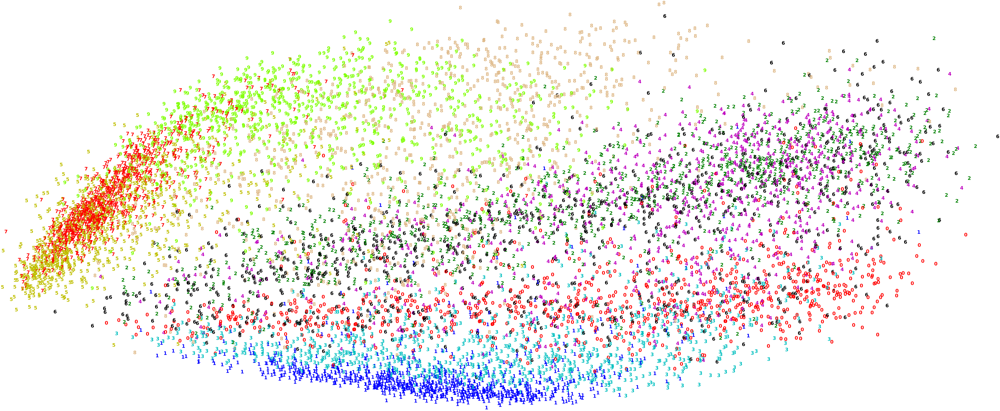

In [5]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Do you think PCA solution is satisfactory? Can you distinguish between different classes easily?

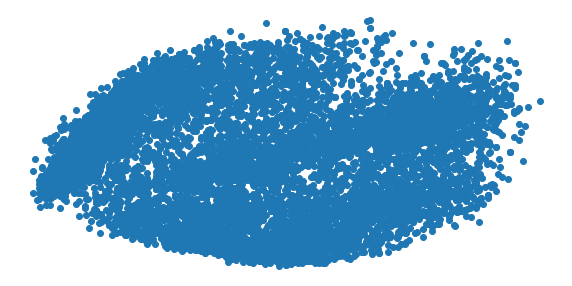

In [6]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Looking at the graph of PCA I would say that this is unsatisfactory. Without labeling I couldn't really say what the classes are.

# t-SNE

## Apply t-SNE to the data by setting n_components=2.

In [7]:
from sklearn.manifold import TSNE
import time


In [8]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.444s...
[t-SNE] Computed neighbors for 10000 samples in 128.326s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.836341
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.644913
[t-SNE] KL divergence after 300 iterations: 2.520274
t-SNE done! Time elapse

## Using the two-dimensional t-SNE representation, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.

In [9]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Do you think t-SNE solution is satisfactory? Can you distinguish between different classes easily? Which one has done a better job: t-SNE or the PCA you applied in the assignment of the previous checkpoint?

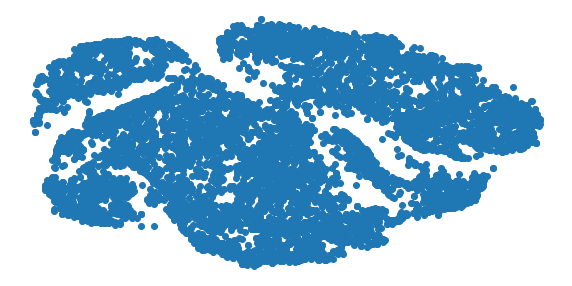

In [10]:
plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

I think it's pretty plain to see that t-SNE distinguishes much better than PCA in finding individual classes without labeling.

## Now, play with the different perplexity values and apply t-SNE for each of them. Which perplexity value is the best one in terms of the two-dimensional representation clarity?


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.486s...
[t-SNE] Computed neighbors for 10000 samples in 448.059s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.410689
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.342735
[t-SNE] KL divergence after 300 iterations: 3.498818


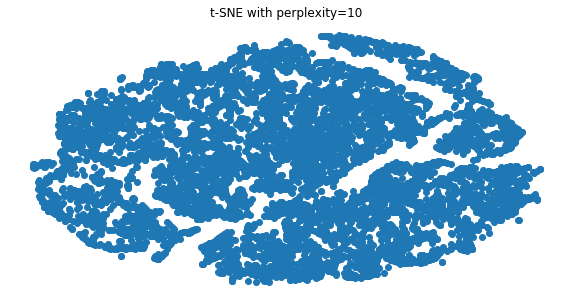

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.393s...
[t-SNE] Computed neighbors for 10000 samples in 1744.387s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.627323
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.128319
[t-SNE] KL divergence after 300 iterations: 3.006220


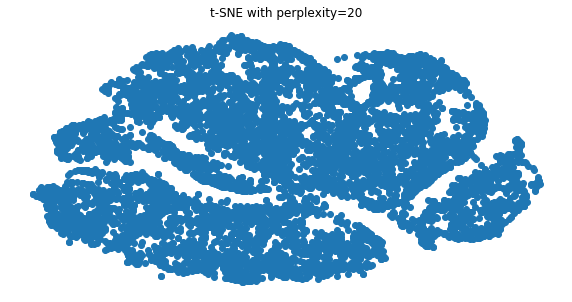

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.372s...
[t-SNE] Computed neighbors for 10000 samples in 133.497s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.749189
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.969589
[t-SNE] KL divergence after 300 iterations: 2.723341


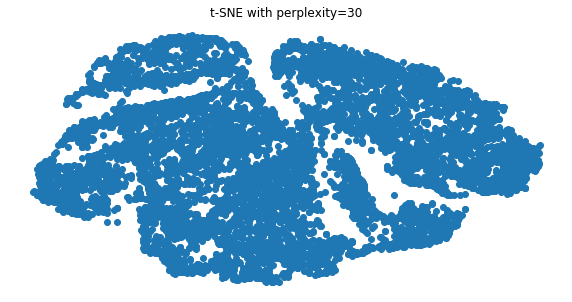

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.371s...
[t-SNE] Computed neighbors for 10000 samples in 127.081s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.836341
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.654358
[t-SNE] KL divergence after 300 iterations: 2.521266


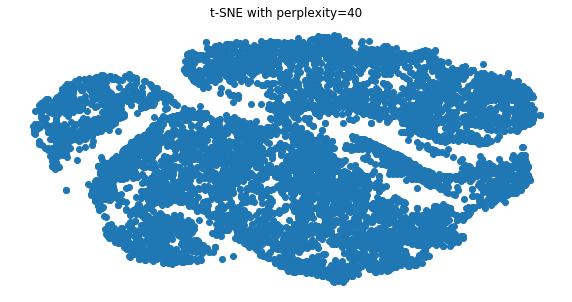

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.366s...
[t-SNE] Computed neighbors for 10000 samples in 690.396s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.905309
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.972900
[t-SNE] KL divergence after 300 iterations: 2.376785


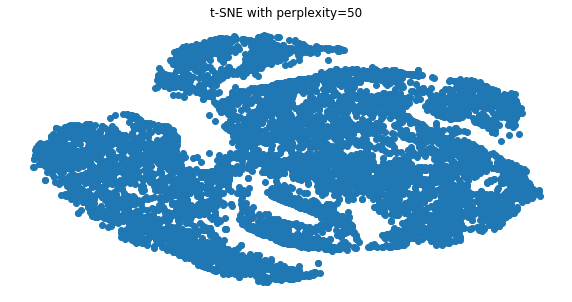

[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.376s...
[t-SNE] Computed neighbors for 10000 samples in 128.065s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.963126
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.326035
[t-SNE] KL divergence after 300 iterations: 2.245689


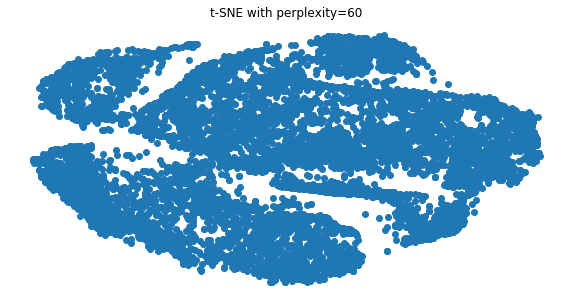

[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.380s...
[t-SNE] Computed neighbors for 10000 samples in 128.692s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.013310
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.201752
[t-SNE] KL divergence after 300 iterations: 2.150390


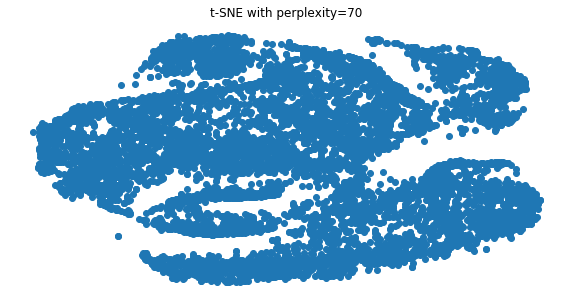

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.371s...
[t-SNE] Computed neighbors for 10000 samples in 127.978s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.057941
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.983276
[t-SNE] KL divergence after 300 iterations: 2.051225


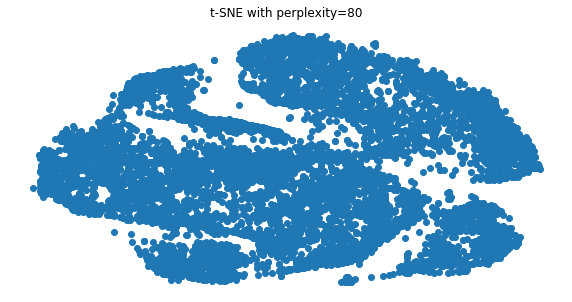

[t-SNE] Computing 271 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.419s...
[t-SNE] Computed neighbors for 10000 samples in 126.623s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.098317
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.017326
[t-SNE] KL divergence after 300 iterations: 1.973905


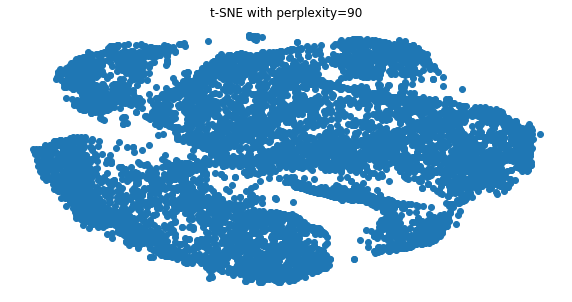

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.621s...
[t-SNE] Computed neighbors for 10000 samples in 129.065s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.135346
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.237160
[t-SNE] KL divergence after 300 iterations: 1.915107


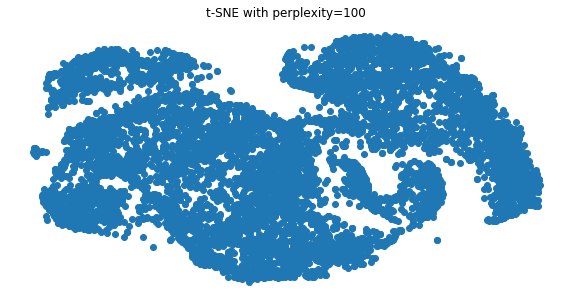

In [11]:
for i in range(10,110,10):
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=300)
    tsne_results = tsne.fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.title("t-SNE with perplexity={}".format(i))
    plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()



It looks like 50 or 90 complexity have the best visual representation. Though all t-SNE representations are better than PCA. I would still say that without labeling or coloring it is hard to tell the classes apart.

# UMAP

In [12]:
import umap

In [14]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

/Users/richardlafferty/anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "anaconda3/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/Users/richardlafferty/anaconda3/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "anaconda3/lib/

UMAP done! Time elapsed: 20.17213797569275 seconds


## Using the two-dimensional UMAP representation, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.


In [15]:

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Do you think UMAP solution is satisfactory? Can you distinguish between different classes easily? Which one has done a better job: UMAP or the others (t-SNE or PCA) that you applied in the assignments of the previous checkpoints?

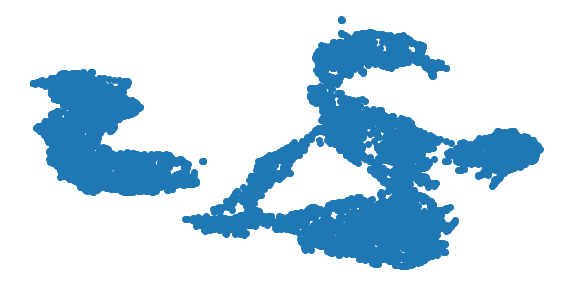

In [16]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Looking at the 3 options it is plain that UMAP is much better at distinguishing classes. 

## Now, play with the different hyperparameter values of the UMAP and apply UMAP for each of them. Which combination is the best in terms of the two-dimensional representation clarity?

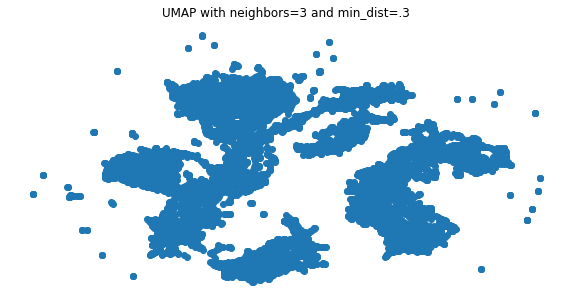

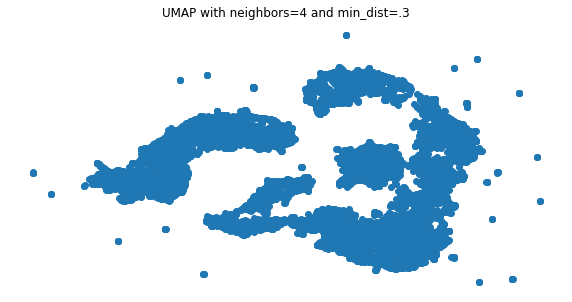

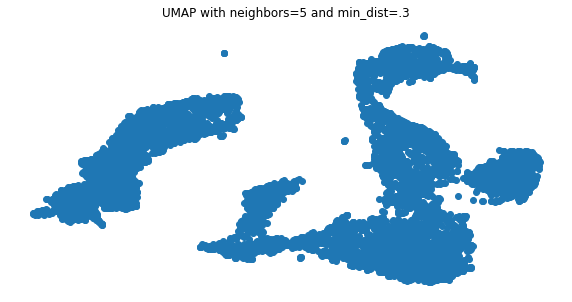

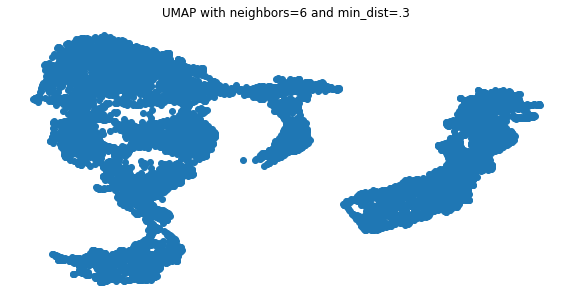

In [35]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=.3,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=.3".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

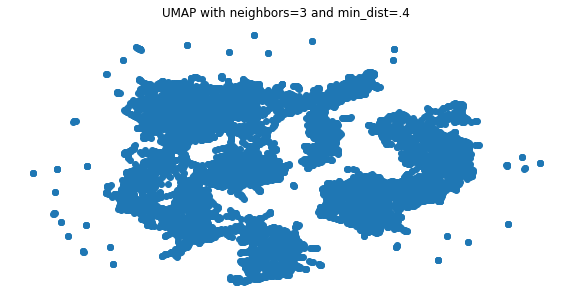

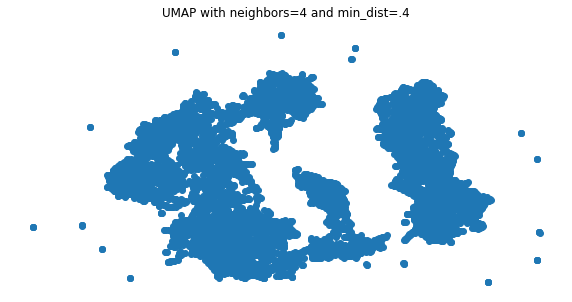

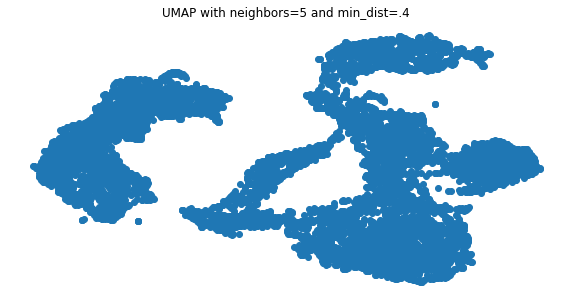

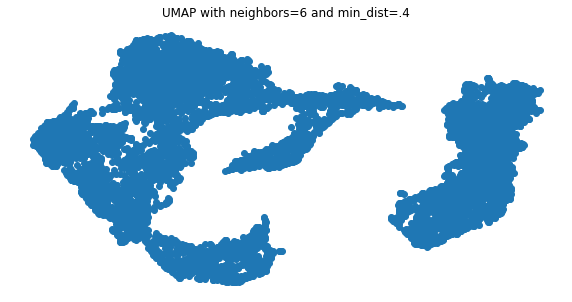

In [41]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=.4,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=.4".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

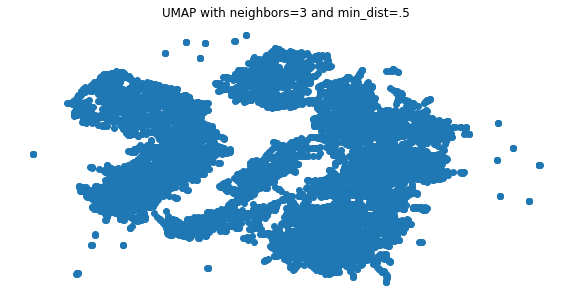

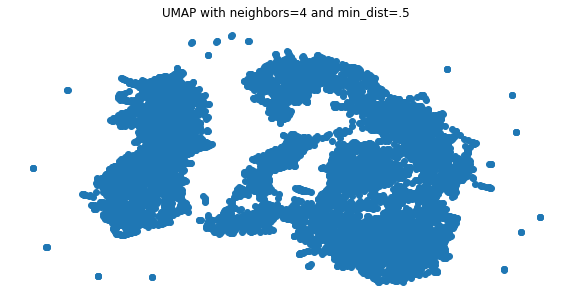

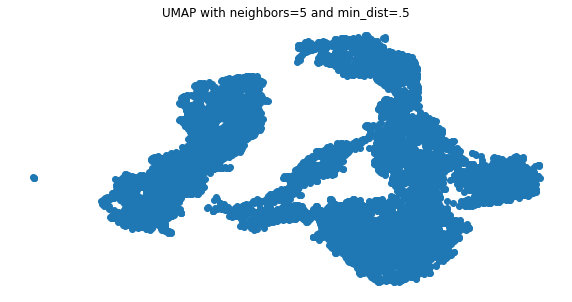

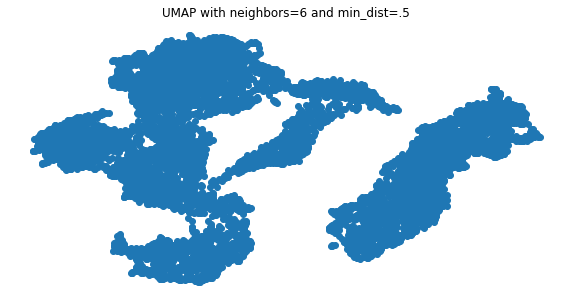

In [40]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=.5,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=.5".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

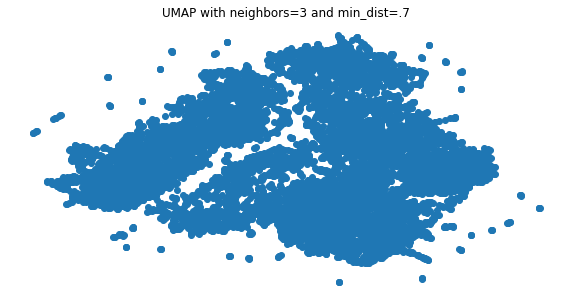

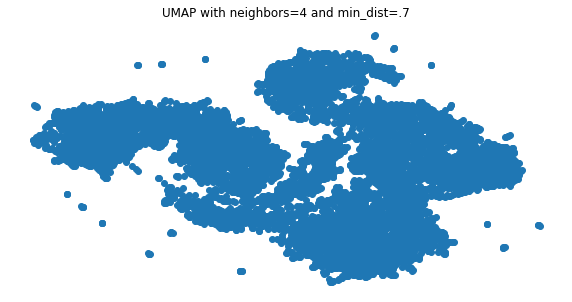

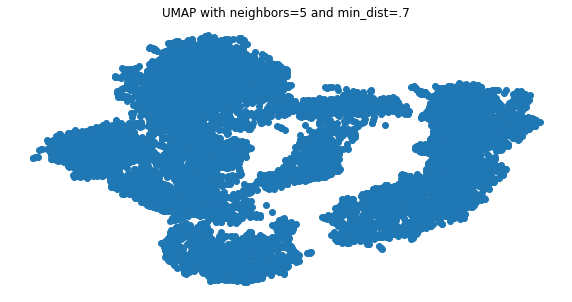

In [39]:
for i in range(3, 6, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=.7,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=.7".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

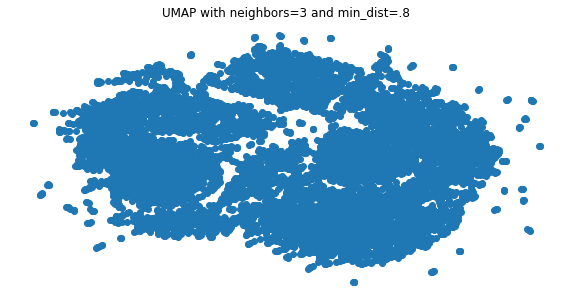

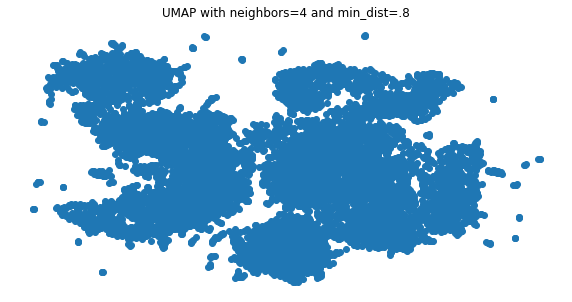

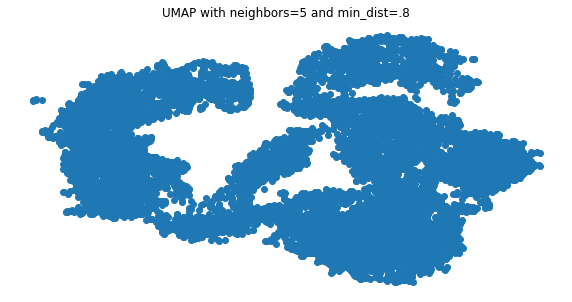

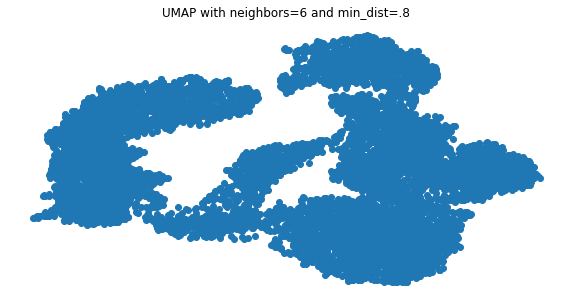

In [36]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=.8,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=.8".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

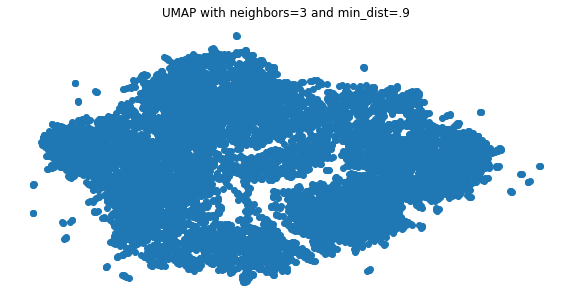

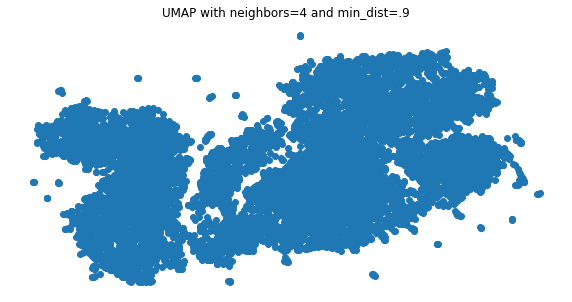

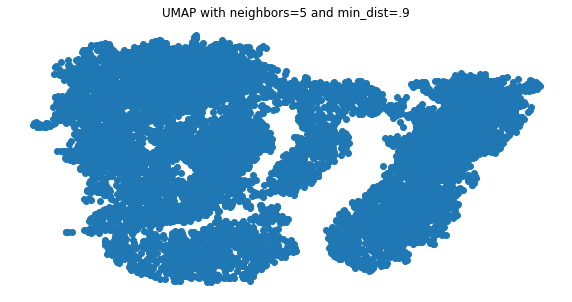

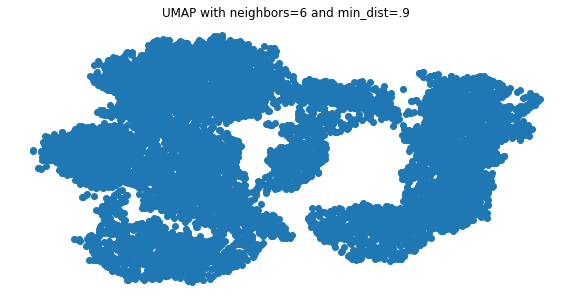

In [37]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=.9,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=.9".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

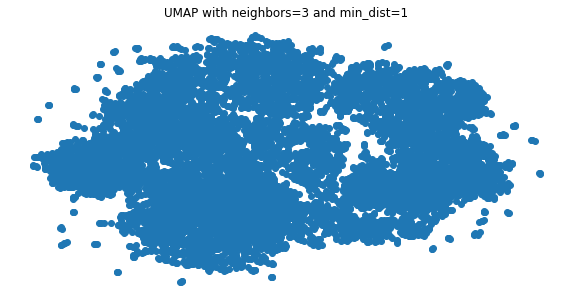

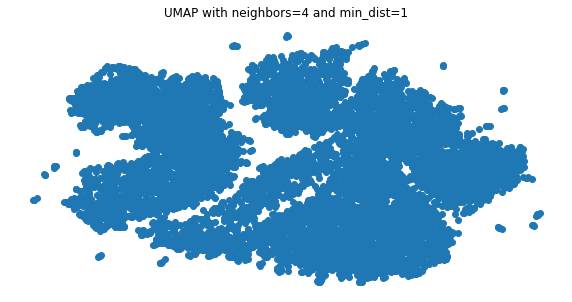

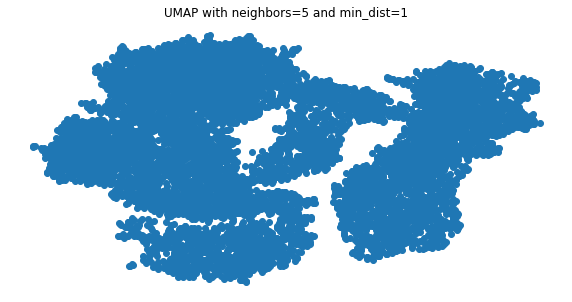

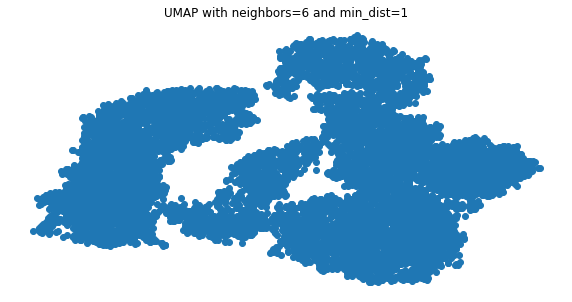

In [38]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=1,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=1".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

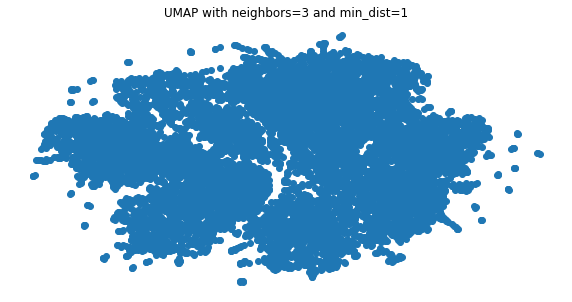

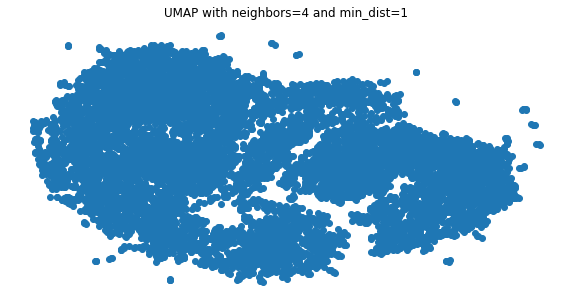

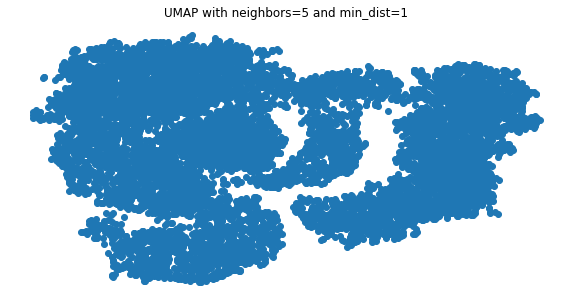

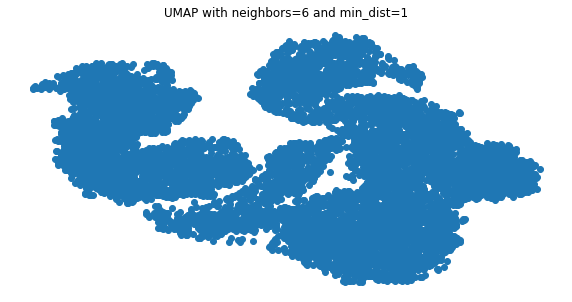

In [42]:
for i in range(3, 7, 1):
    umap_results = umap.UMAP(n_neighbors=i,
                             min_dist=1,
                             metric='correlation').fit_transform(X)
    plt.figure(figsize=(10,5))
    plt.scatter(umap_results[:, 0], umap_results[:, 1])
    plt.title("UMAP with neighbors={} and min_dist=1".format(i))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()
    

.3 min_distance and 3 n_neighbors looks pretty good and so does n_neighbors 3 min_distance .4